In [1]:
cd F:\PROJECTS\PROJECT_MONKEY SC-RNA SEQ\WORKPLACE\R\

F:\PROJECTS\PROJECT_MONKEY SC-RNA SEQ\WORKPLACE\R


In [3]:
# Load dataset 
import scanpy as sc
adata_macaque = sc.read("scvi_macaque_cell-type_final.h5ad")
print("adata_to dims: {}".format(adata_macaque.shape)) 

adata_to dims: (36701, 15315)


In [4]:
adata_macaque

AnnData object with n_obs × n_vars = 36701 × 15315
    obs: 'CellID', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_MT', 'pct_counts_MT', 'total_counts_HB', 'pct_counts_HB', 'total_counts_Hb', 'pct_counts_Hb', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'batch', 'age', 'cluster3', 'cell_type', 'n_counts', 'leiden_res2', 'leiden_res5', 'cluster4', 'region'
    var: 'gene_ids', 'feature_types', 'Gene', 'genome-0', 'n_cells-0', 'm-0', 'v-0', 'n_obs-0', 'res-0', 'lp-0', 'lpa-0', 'qv-0', 'highly_variable-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'Mt-0', 'MT-0', 'HB-0', 'Hb-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'genome-1', 'n_cells-1', 'm-1', 'v-1', 'n_obs-1', 'res-1', 'lp-1', 'lpa-1', 'qv-1', 'highly_variable-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'MT-1', 'Hb-1', 'mean

G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\plotting\_tools\scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


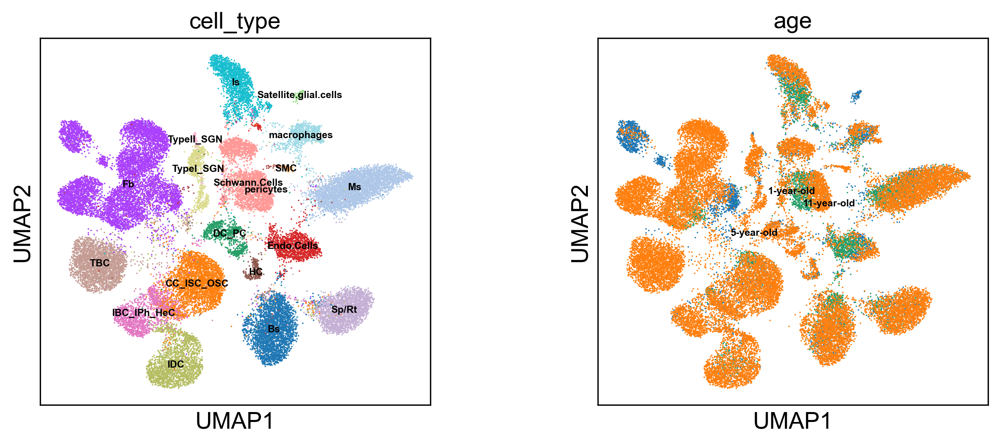

In [8]:
sc.set_figure_params(figsize=(4,4),frameon=True,dpi=150,dpi_save=600)
sc.pl.umap(
    adata_macaque, legend_fontsize=6,
    color=['cell_type','age'], legend_loc='on data',wspace=0.3
    
)#ncols = 1,

In [9]:
adata_mac_hc=adata_macaque[adata_macaque.obs['cell_type'].isin(["HC"])]
adata_mac_hc

View of AnnData object with n_obs × n_vars = 259 × 15315
    obs: 'CellID', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_MT', 'pct_counts_MT', 'total_counts_HB', 'pct_counts_HB', 'total_counts_Hb', 'pct_counts_Hb', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'batch', 'age', 'cluster3', 'cell_type', 'n_counts', 'leiden_res2', 'leiden_res5', 'cluster4', 'region'
    var: 'gene_ids', 'feature_types', 'Gene', 'genome-0', 'n_cells-0', 'm-0', 'v-0', 'n_obs-0', 'res-0', 'lp-0', 'lpa-0', 'qv-0', 'highly_variable-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'Mt-0', 'MT-0', 'HB-0', 'Hb-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'genome-1', 'n_cells-1', 'm-1', 'v-1', 'n_obs-1', 'res-1', 'lp-1', 'lpa-1', 'qv-1', 'highly_variable-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'MT-1', 'Hb-1',

In [10]:
from scipy.sparse import csr_matrix
import numpy as np
adata_mac_hc.X=csr_matrix(np.power(10, adata_mac_hc.X.A)-1)

In [11]:
#import scFates as scf

In [12]:
#import scFates as scf
sc.pp.filter_genes(adata_mac_hc,min_cells=1)
sc.pp.normalize_total(adata_mac_hc, target_sum=1e3)
sc.pp.log1p(adata_mac_hc)
#scf.pp.find_overdispersed(adata,plot=True)
adata_mac_hc.layers["scaled"]=sc.pp.scale(adata_mac_hc.X,max_value=5,copy=True)
adata_mac_hc.obsm["X_pca"]=sc.pp.pca(adata_mac_hc[:,adata_mac_hc.var.highly_variable].layers["scaled"])
sc.pp.neighbors(adata_mac_hc,n_neighbors=15,n_pcs=15,metric="cosine")


G:\Miniconda3\envs\coefates\lib\site-packages\scanpy\preprocessing\_simple.py:250: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var['n_cells'] = number


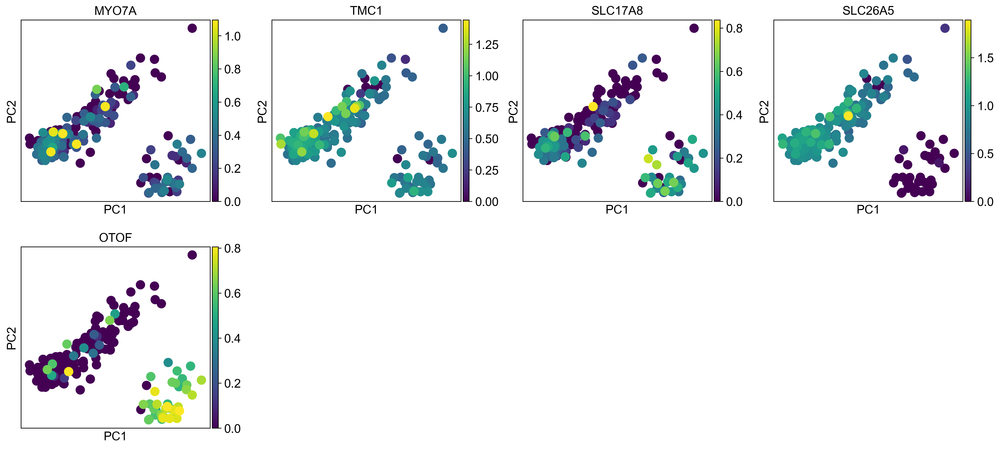

In [13]:
sc.pl.pca(adata_mac_hc, color=['MYO7A','TMC1','SLC17A8','SLC26A5','OTOF' ] )

In [14]:
adata_mac_hc

AnnData object with n_obs × n_vars = 259 × 13857
    obs: 'CellID', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_MT', 'pct_counts_MT', 'total_counts_HB', 'pct_counts_HB', 'total_counts_Hb', 'pct_counts_Hb', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'batch', 'age', 'cluster3', 'cell_type', 'n_counts', 'leiden_res2', 'leiden_res5', 'cluster4', 'region'
    var: 'gene_ids', 'feature_types', 'Gene', 'genome-0', 'n_cells-0', 'm-0', 'v-0', 'n_obs-0', 'res-0', 'lp-0', 'lpa-0', 'qv-0', 'highly_variable-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'Mt-0', 'MT-0', 'HB-0', 'Hb-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'genome-1', 'n_cells-1', 'm-1', 'v-1', 'n_obs-1', 'res-1', 'lp-1', 'lpa-1', 'qv-1', 'highly_variable-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'MT-1', 'Hb-1', 'means-

In [15]:
sc.tl.umap(adata_mac_hc)

In [16]:
sc.tl.leiden(adata_mac_hc)

In [17]:
adata_mac_hc.obsm["X_umap"][:,0]

array([14.018373 ,  4.411279 , 17.28166  , 13.703618 , 14.33624  ,
       11.798825 , 14.115384 , 15.909728 , 11.652689 ,  3.8063788,
       16.523611 , 15.538858 , 15.881138 , 15.177664 ,  7.4135633,
        4.159544 ,  7.2451415, 14.916079 , 16.800745 , 16.294783 ,
       17.180391 , 13.643671 , 15.203052 , 16.46986  ,  4.1830883,
       12.294358 , 14.136629 , 13.367866 , 17.002079 , 12.321211 ,
       14.463616 , 15.843355 , 16.034578 , 11.764415 , 13.052832 ,
       15.9479475, 15.385062 , 15.263715 , 15.060124 , 16.991    ,
       15.362222 , 11.229438 , 13.56404  , 11.357768 ,  4.118898 ,
       13.581724 , 15.917899 ,  4.6752567, 16.478764 , 10.935695 ,
        9.477666 , 11.441659 , 16.94052  , 12.585945 , 10.44907  ,
       16.123404 , 15.325008 , 14.331553 , 16.806852 , 14.558701 ,
       10.350847 , 12.224138 , 14.674076 , 14.464898 , 16.52441  ,
       11.713036 ,  3.9660294, 14.516396 ,  4.0319138, 13.915091 ,
       12.194799 , 11.769854 , 11.144099 , 12.512349 , 14.8375

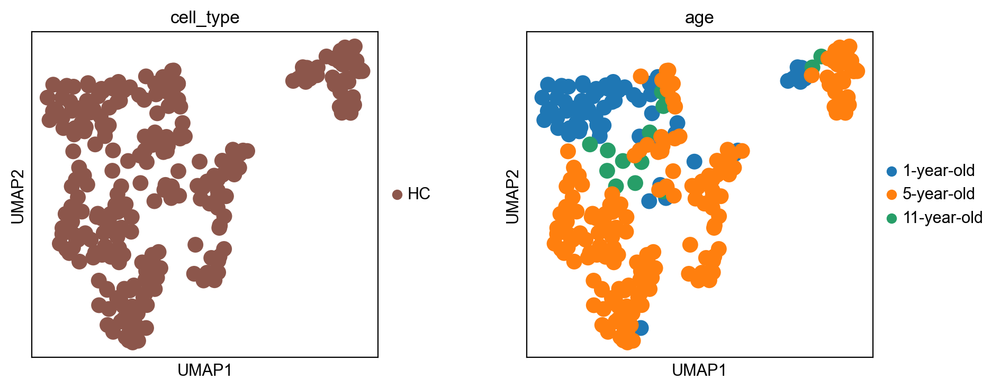

In [24]:
sc.pl.umap(adata_mac_hc, color=['cell_type', 'age'], wspace=0.3)

In [27]:
import os
import tempfile
import scanpy as sc
import scvi
import seaborn as sns
import torch

In [28]:
scvi.settings.seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Global seed set to 0


Last run with scvi-tools version: 0.14.6


In [29]:
# ignore ccgenes analysis
def run_scvi(adata, batch_hv = "age", batch_scvi = "batch", \
             cat_cov_scvi = ["batch",  "age"],  \
             include_genes = [], exclude_cc_genes=False, vae_name = "", **kwargs):
    adata_scvi = adata.copy()
    #adata_scvi.layers["counts"] = adata_scvi.X.copy()
    #sc.pp.normalize_total(adata_scvi, target_sum=1e4)
    #sc.pp.log1p(adata_scvi)
     # keep full dimension safe
    sc.pp.highly_variable_genes(adata_scvi, flavor="seurat_v3", n_top_genes=10000, layer="counts",\
                                batch_key="age")
    selected_genes = list(set(adata_scvi.var.loc[adata_scvi.var['highly_variable']].index.tolist()+ include_genes))
    print(len(selected_genes))

    adata_scvi = adata_scvi[:, selected_genes].copy()
    scvi.model.SCVI.setup_anndata(adata_scvi, layer="counts", batch_key=batch_scvi, \
                             categorical_covariate_keys=cat_cov_scvi
                             )
    scvi_kwargs = {k: v for k,v in kwargs.items() if k in scvi.model.SCVI.__init__.__code__.co_varnames}
    vae = scvi.model.SCVI(adata_scvi, **scvi_kwargs)
    train_kwargs = {k: v for k,v in kwargs.items() if k in vae.train.__code__.co_varnames}
    vae.train(**train_kwargs)
    adata_scvi.obsm["X_scVI"] = vae.get_latent_representation()
    
    
    return(adata_scvi)



In [30]:
adata_scvi = run_scvi(adata_mac_hc, batch_hv = "age", batch_scvi = "batch", 
             cat_cov_scvi = ["age", "batch"] )
             #include_genes = marker_genes,)

10000
INFO     Using batches from adata.obs["batch"]                                                                     
INFO     No label_key inputted, assuming all cells have same label                                                 
INFO     Using data from adata.layers["counts"]                                                                    
INFO     Successfully registered anndata object containing 259 cells, 10000 vars, 5 batches, 1 labels, and 0       
         proteins. Also registered 2 extra categorical covariates and 0 extra continuous covariates.               
INFO     Please do not further modify adata until model is trained.                                                


GPU available: False, used: False
TPU available: False, using: 0 TPU cores


Epoch 400/400: 100%|█| 400/400 [00:45<00:00,  8.83it/s, loss=4.08e+03, v_


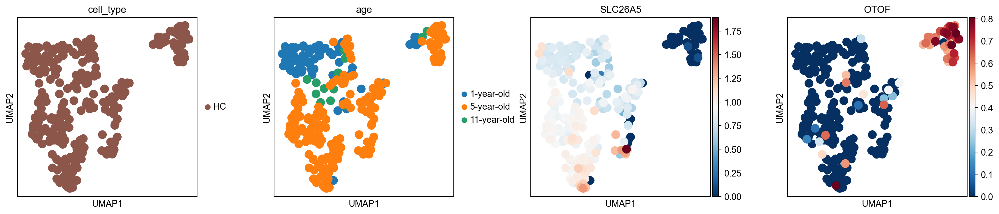

In [34]:
sc.pl.umap(adata_scvi, color=['cell_type', 'age','SLC26A5','OTOF'], wspace=0.3)

In [35]:
sc.pp.neighbors(adata_scvi, use_rep="X_scVI")
sc.tl.leiden(adata_scvi)
sc.tl.umap(adata_scvi)

In [36]:
adata_scvi

AnnData object with n_obs × n_vars = 259 × 10000
    obs: 'CellID', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_MT', 'pct_counts_MT', 'total_counts_HB', 'pct_counts_HB', 'total_counts_Hb', 'pct_counts_Hb', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'batch', 'age', 'cluster3', 'cell_type', 'n_counts', 'leiden_res2', 'leiden_res5', 'cluster4', 'region', '_scvi_batch', '_scvi_labels'
    var: 'gene_ids', 'feature_types', 'Gene', 'genome-0', 'n_cells-0', 'm-0', 'v-0', 'n_obs-0', 'res-0', 'lp-0', 'lpa-0', 'qv-0', 'highly_variable-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'Mt-0', 'MT-0', 'HB-0', 'Hb-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'genome-1', 'n_cells-1', 'm-1', 'v-1', 'n_obs-1', 'res-1', 'lp-1', 'lpa-1', 'qv-1', 'highly_variable-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_cou

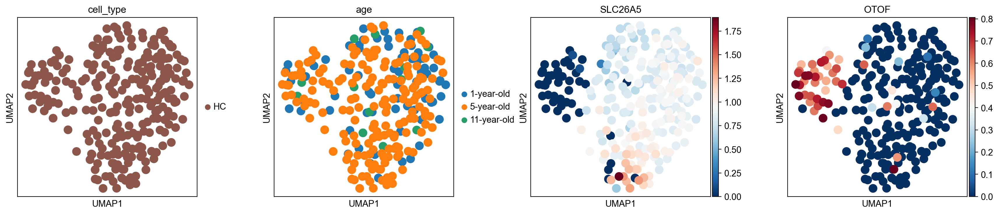

In [37]:
sc.pl.umap(adata_scvi, color=['cell_type', 'age','SLC26A5','OTOF'], wspace=0.3)

In [39]:
import pandas as pd

In [40]:
#Save latent space
pd.DataFrame(adata_scvi.obsm["X_scVI"]).to_csv('macaque_HC_XscVI_latent_space.csv')

In [41]:
#Normalized
sc.pp.normalize_per_cell(adata_mac_hc, counts_per_cell_after=1e4)
sc.pp.log1p(adata_mac_hc)

In [42]:
#Load latent space scVI
X_scVI = pd.read_csv('macaque_HC_XscVI_latent_space.csv', index_col=0)
adata_mac_hc.obsm["X_scVI"] = X_scVI.to_numpy()

In [43]:
adata_mac_hc

AnnData object with n_obs × n_vars = 259 × 13857
    obs: 'CellID', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_MT', 'pct_counts_MT', 'total_counts_HB', 'pct_counts_HB', 'total_counts_Hb', 'pct_counts_Hb', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'batch', 'age', 'cluster3', 'cell_type', 'n_counts', 'leiden_res2', 'leiden_res5', 'cluster4', 'region'
    var: 'gene_ids', 'feature_types', 'Gene', 'genome-0', 'n_cells-0', 'm-0', 'v-0', 'n_obs-0', 'res-0', 'lp-0', 'lpa-0', 'qv-0', 'highly_variable-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'Mt-0', 'MT-0', 'HB-0', 'Hb-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'genome-1', 'n_cells-1', 'm-1', 'v-1', 'n_obs-1', 'res-1', 'lp-1', 'lpa-1', 'qv-1', 'highly_variable-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'MT-1', 'Hb-1', 'means-

In [66]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata_mac_hc, use_rep="X_scVI",n_neighbors=40)
sc.tl.leiden(adata_mac_hc)
sc.tl.umap(adata_mac_hc,min_dist=0.35)#, min_dist=0.4

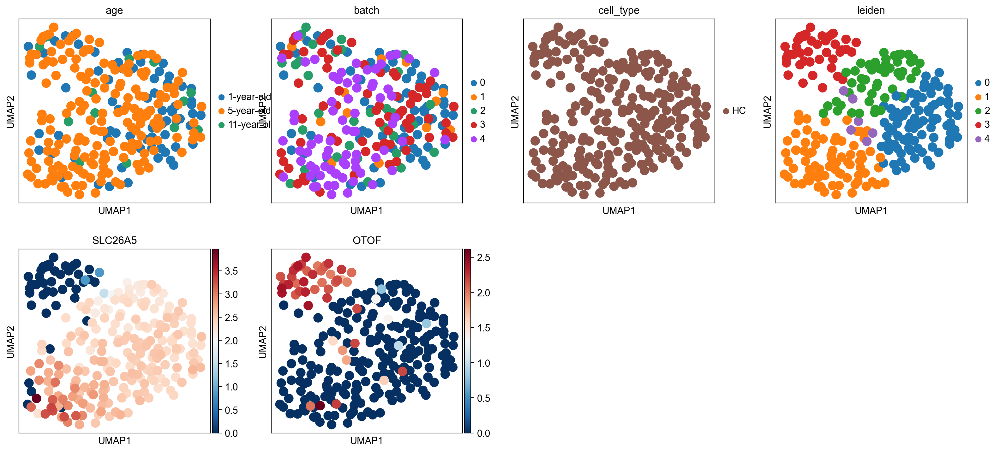

In [67]:
sc.pl.umap(
    adata_mac_hc,
    color=['age',  "batch",'cell_type','leiden','SLC26A5','OTOF'], 
    frameon=True, wspace = 0.2
)

In [69]:
#RENAME SUBTYPE
cluster_annotation = {
    '0': 'OHC',
    '1': 'OHC',
    '2': 'OHC',
    '3': 'IHC',
    '4': 'OHC',
}
adata_mac_hc.obs['subtype'] = adata_mac_hc.obs['leiden'].map(cluster_annotation).astype('category')

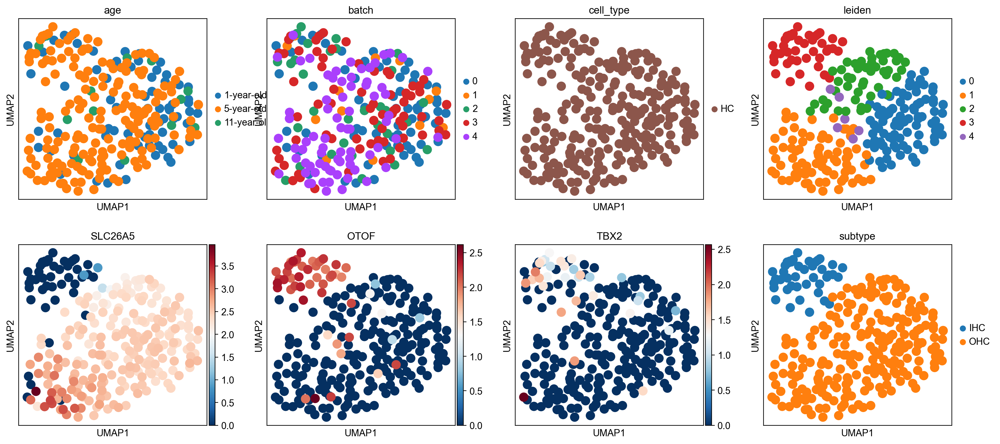

In [73]:
sc.pl.umap(
    adata_mac_hc,
    color=['age',  "batch",'cell_type','leiden','SLC26A5','OTOF','TBX2','subtype'], 
    frameon=True, wspace = 0.2
)

In [74]:
adata_mac_hc.obsm["X_umap"][:,0]=-adata_mac_hc.obsm["X_umap"][:,0]

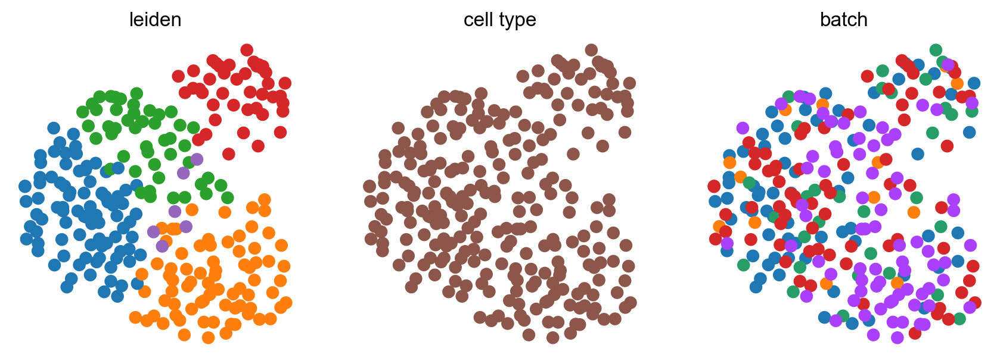

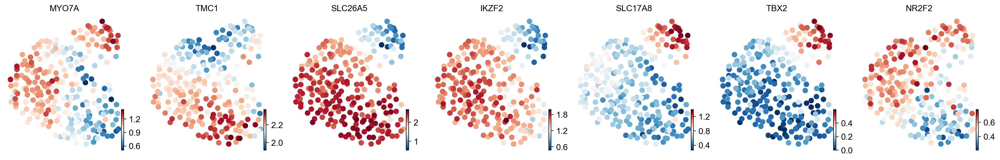

In [75]:
import scvelo as scv
scv.set_figure_params(figsize=(3.5,3.5))
scv.pl.umap(adata_mac_hc,color=["leiden","cell_type","batch"])

scv.pl.umap(adata_mac_hc, color=['MYO7A','TMC1','SLC26A5',"IKZF2","SLC17A8","TBX2","NR2F2"],smooth=True)

In [76]:
scv.set_figure_params(figsize=(4,4))
import matplotlib.pyplot as plt

In [77]:
IHC=["SLC17A8","TBX2","CALB2","ATP2A3"]
OHC=["SLC26A5","IKZF2","KCNQ4","PCP4"]

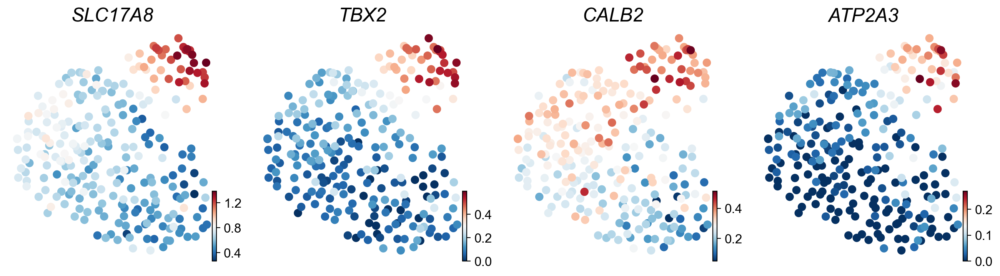

In [78]:
axs=scv.pl.umap(adata_mac_hc,color=IHC,smooth=True,show=False)
for ax in axs:
    ax.set_title(ax.get_title(),style="italic",fontsize=18)
plt.savefig("figures/IHC_MACAQUE_v2.pdf",dpi=600)

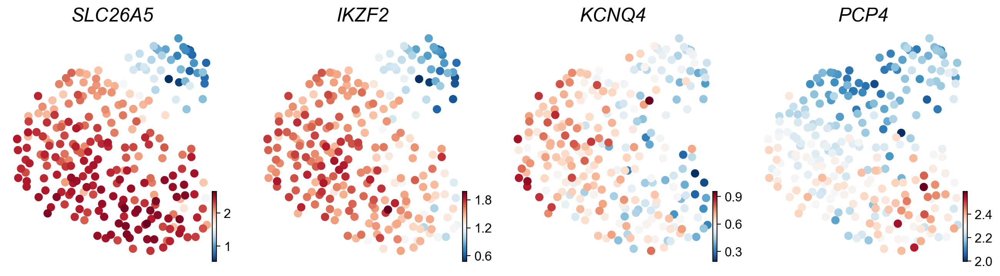

In [79]:
axs=scv.pl.umap(adata_mac_hc,color=OHC,smooth=True,show=False)
for ax in axs:
    ax.set_title(ax.get_title(),style="italic",fontsize=18)
plt.savefig("figures/OHC_MACAQUE_v2.pdf",dpi=600)

In [80]:
sc.tl.score_genes(adata_mac_hc,OHC,score_name="OHC")
sc.tl.score_genes(adata_mac_hc,IHC,score_name="IHC")

In [81]:
adata_mac_hc.obs["assigned"]="non assigned"
adata_mac_hc.obs.loc[(adata_mac_hc.obs.OHC>adata_mac_hc.obs.IHC),"assigned"]="OHC"
adata_mac_hc.obs.loc[(adata_mac_hc.obs.IHC>adata_mac_hc.obs.OHC),"assigned"]="IHC"

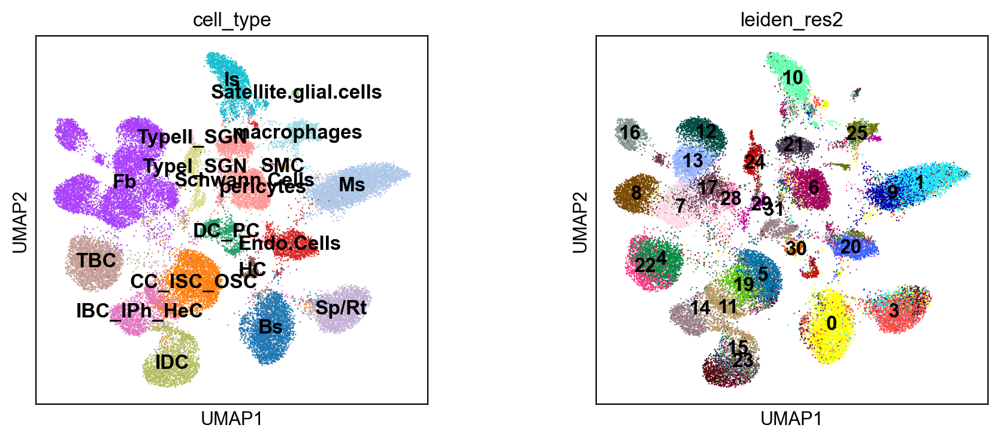

In [84]:
sc.pl.umap(adata_macaque,color=["cell_type",'leiden_res2'],legend_loc='on data', wspace=0.3)

In [85]:
adata_macaque.obs["sel1"]=(adata_macaque.obs.cell_type=='HC').astype(str)

In [87]:
adata_macaque.obs["sel"]=(adata_macaque.obs.leiden_res2=='30').astype(str)

saving figure to file ./figures/scvelo_cochlea-cell_type_macaque_batch_v2.pdf


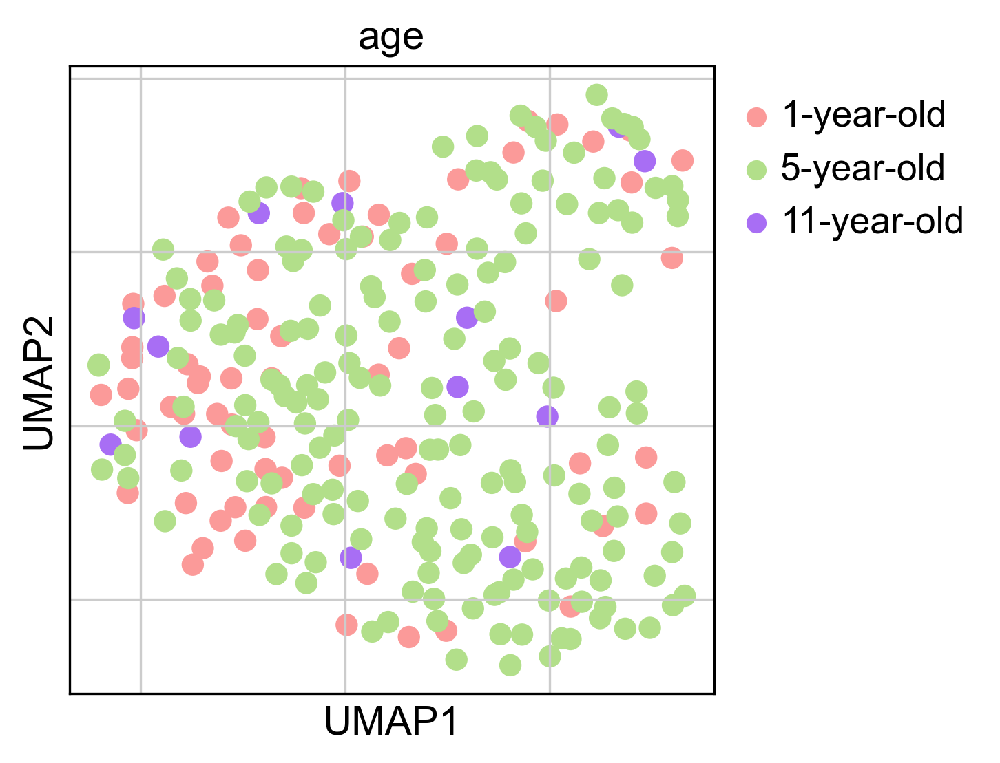

In [88]:
sc.set_figure_params(figsize=(4,4),frameon=False,dpi=150,dpi_save=600)
scv.pl.umap(adata_mac_hc,color="age",palette=["#FB9A99","#B2DF8A","#a86ef4"]
           ,frameon=True, save="cochlea-cell_type_macaque_batch_v2.pdf")

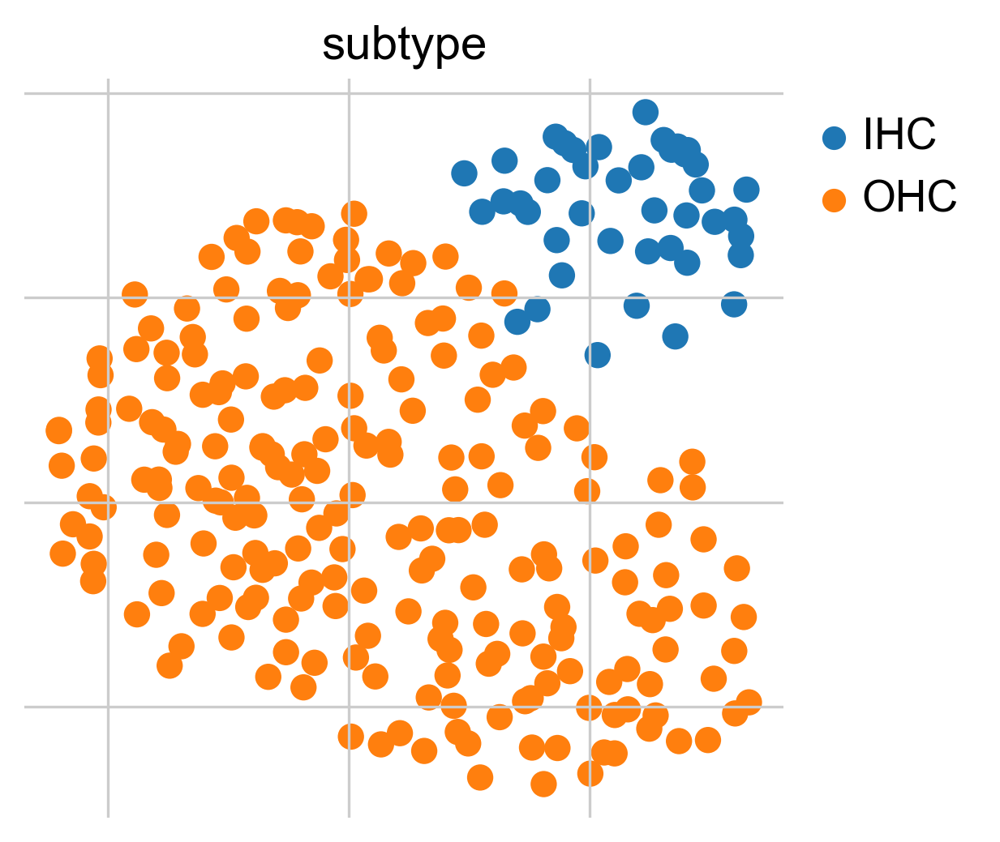

saving figure to file figures/cochear_HC_macaque_v2.pdf


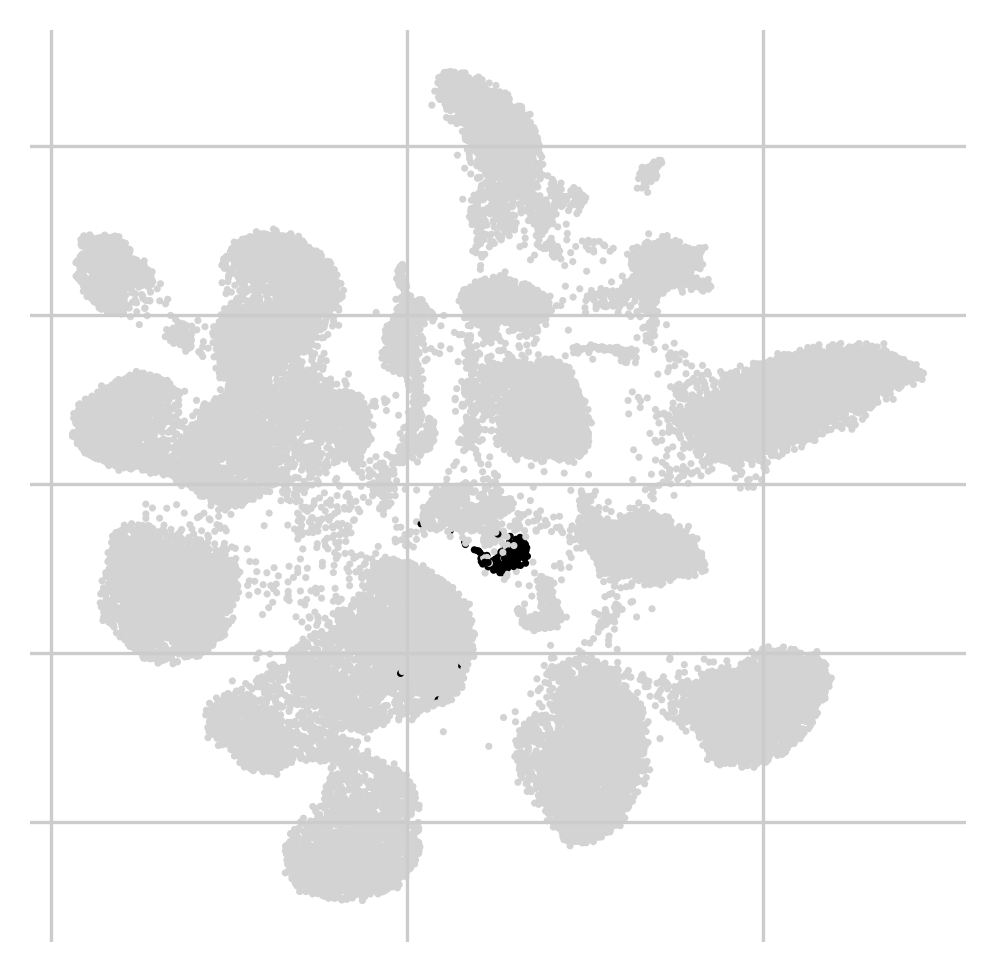

In [89]:
scv.pl.umap(adata_mac_hc,color="subtype",palette=["tab:#ff7f00","tab:#1f78b4"])
scv.pl.umap(adata_macaque,color=["sel"],palette=["lightgrey","k"],frameon=False,legend_loc="none",title="",save="figures/cochear_HC_macaque_v2.pdf")


In [90]:
from matplotlib.patches import ConnectionPatch

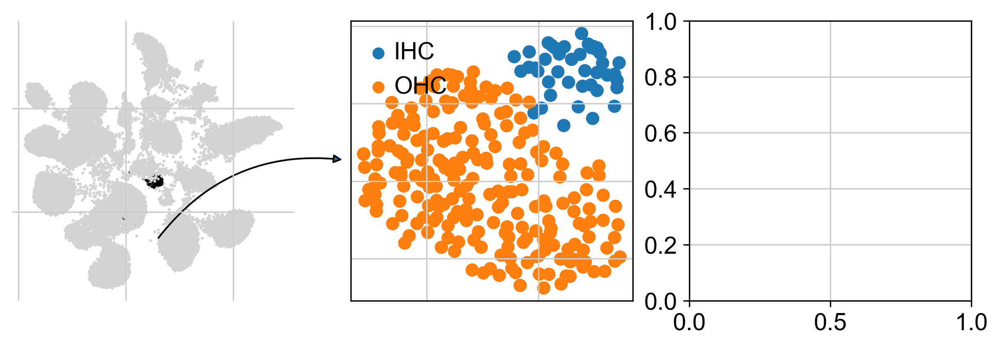

In [91]:
fig,axs=plt.subplots(1,3,figsize=(10,3))
scv.pl.umap(adata_macaque,color="sel",ax=axs[0],show=False,
                  palette=["lightgrey","k"],frameon=False,legend_loc="none",title="")
scv.pl.umap(adata_mac_hc,color="subtype",title="",frameon=True,ax=axs[1],legend_loc="none",show=False,palette=["tab:#ff7f00","tab:#1f78b4"])
axs[1].set_xlabel("")
axs[1].set_ylabel("")
axs[1].legend(frameon=False,fontsize=14)

con1 = ConnectionPatch(xyA=(0.5, .2), coordsA="axes fraction", connectionstyle="arc3,rad=-0.3",arrowstyle="-|>",
                       xyB=(0, .5), coordsB="axes fraction", axesA=axs[0],axesB=axs[1],shrinkA=5,shrinkB=5)

axs[0].add_artist(con1)
plt.savefig("figures/cochear_HC_macaque_v2.pdf",dpi=600)

In [92]:
adata_mac_hc.write("adata_mac_HC_final.h5ad")

In [95]:
import scanpy as sc
#from scvelo.preprocessing.neighbors import get_connectivities
adata_mac_hc=sc.read('adata_mac_HC_final.h5ad')

In [96]:
adata_mac_hc2=adata_mac_hc.copy()

In [97]:
adata_mac_hc2

AnnData object with n_obs × n_vars = 259 × 13857
    obs: 'CellID', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_MT', 'pct_counts_MT', 'total_counts_HB', 'pct_counts_HB', 'total_counts_Hb', 'pct_counts_Hb', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'batch', 'age', 'cluster3', 'cell_type', 'n_counts', 'leiden_res2', 'leiden_res5', 'cluster4', 'region', 'subtype', 'OHC', 'IHC', 'assigned'
    var: 'gene_ids', 'feature_types', 'Gene', 'genome-0', 'n_cells-0', 'm-0', 'v-0', 'n_obs-0', 'res-0', 'lp-0', 'lpa-0', 'qv-0', 'highly_variable-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'Mt-0', 'MT-0', 'HB-0', 'Hb-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'genome-1', 'n_cells-1', 'm-1', 'v-1', 'n_obs-1', 'res-1', 'lp-1', 'lpa-1', 'qv-1', 'highly_variable-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'tot

In [99]:
import os, sys
os.getcwd()
os.listdir(os.getcwd())
import loompy as lp;
import numpy as np;
import scanpy as sc;
row_attrs = {"Gene": np.array(adata_mac_hc2.var_names),};
col_attrs = {"CellID": np.array(adata_mac_hc2.obs['cell_type'])};
lp.create("adata_mac_hc2.loom",adata_mac_hc2.X.transpose(),row_attrs,col_attrs)

In [100]:
adata_counts = adata_mac_hc2.X
adata_counts

<259x13857 sparse matrix of type '<class 'numpy.float32'>'
	with 619565 stored elements in Compressed Sparse Row format>

In [101]:
# shift to python39
import os, sys
os.getcwd()
os.listdir(os.getcwd())
import loompy as lp;
import numpy as np;
import scanpy as sc;
import h5py
import pandas as pd
import anndata as ad

In [102]:
ob1=adata_mac_hc2
mat=pd.DataFrame(data=ob1.X.todense(),index=ob1.obs_names,columns=ob1.var_names)
mat.to_hdf('mat.h5','mat')

ImportError: Missing optional dependency 'pytables'.  Use pip or conda to install pytables.

In [10]:
meta=pd.DataFrame(data=ob1.obs)
meta.to_csv('metadata_mac_hc.tsv',sep='\t')

In [11]:
#save UMAP COORDINATION
cord=pd.DataFrame(data=ob1.obsm['X_umap'],index=ob1.obs_names, columns=['x','y'])
cord.to_csv('position_mac_hc_X_umap.tsv', sep='\t')

#construct seurat object
library(rhdf5)
library(Matrix)
mydata <- h5read("mat.h5","mat")
#get expression matrix
mat <- mydata$block0_values
rownames(mat) <- mydata$axis0
colnames(mat) <- mydata$axis1
mat <- Matrix(mat,sparse=T)
cord_name= 'X_umap'
meta <- read.table('metadata_mac_hc.tsv',sep="\t",header=T,row.names=1)
pos <- read.table (paste0('position_mac_hc_', cord_name, '.tsv'),sep='\t',header=T,row.names=1)
mac_hc <- CreateSeuratObject(mat,assay = "RNA",meta.data = meta)
DefaultAssay(mac_hc) <- "RNA"
mac_hc <- SCTransform(mac_hc)
mac_hc <- RunPCA(mac_hc)
mac_hc<- FindNeighbors(mac_hc)
mac_hc<-FindClusters(mac_hc)
mac_hc <- RunUMAP(mac_hc,dims = 1:10)

mac_hc@reductions$umap@cell.embeddings[,1] <- pos[,1]
mac_hc@reductions$umap@cell.embeddings[,2] <- pos[,2]
DimPlot(mac_hc,group.by = "cell_type")

In [88]:
sc.tl.rank_genes_groups(adata_mac_hc,"cell_type",method="wilcoxon")

In [90]:
sc.get.rank_genes_groups_df(adata_mac_hc,"IHC",pval_cutoff=0.9).shape[0]

695

In [71]:
sc.get.rank_genes_groups_df(adata_mac_hc,"OHC",pval_cutoff=0.9,log2fc_min=0).set_index("names").to_csv("data/MACAQUE_OHC.csv")

In [72]:
sc.get.rank_genes_groups_df(adata_mac_hc,"IHC",pval_cutoff=0.9,log2fc_min=0).set_index("names").to_csv("data/MACAQUE_IHC.csv")

In [64]:
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)
import pandas as pd
writer = pd.ExcelWriter('data/HC_MACAQUE_DE.xlsx', engine='xlsxwriter')
for cl in adata_mac_hc.obs.cell_type.cat.categories:
    sc.get.rank_genes_groups_df(adata_mac_hc,cl,pval_cutoff=1,log2fc_min=0).set_index("names").to_excel(writer, 
                                                                     sheet_name=cl)
    
writer.save()

In [96]:
marker_genes = [
    *["AKAP8L","BCL6","CLOCK","CUX1","CUX2","FOXO3","GPBP1","HIF1A","IKZF2",
     "ISL1","MLXIPL","MTF2","MXI1","PBX1","REST","RORB","SALL3","SMAD1",
     "SOX6","TBX2","TCF12","THRB","ZNF148","ZNF385A","ZNF462","ZNF821"], 
   


    
]

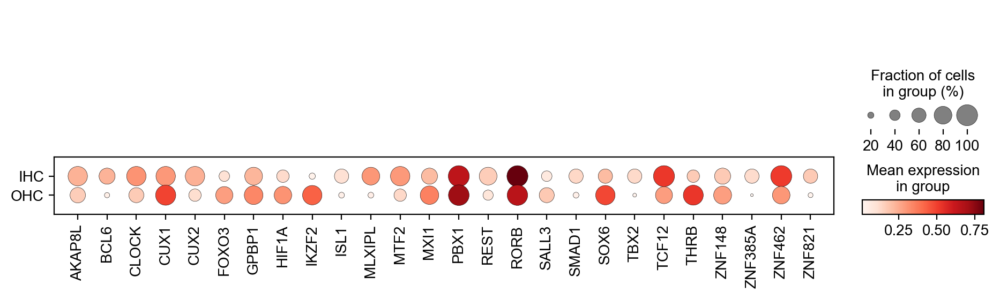

In [97]:
sc.pl.dotplot(adata_mac_hc, marker_genes, groupby="cell_type");

In [98]:
adata_mac_hc

AnnData object with n_obs × n_vars = 99 × 12817
    obs: 'CellID', 'leiden', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_Mt', 'pct_counts_Mt', 'total_counts_MT', 'pct_counts_MT', 'total_counts_HB', 'pct_counts_HB', 'total_counts_Hb', 'pct_counts_Hb', 'louvain', 'cluster', 'cluster2', 'cell_type2', 'cell_type3', 'batch', 'cluster3', 'cell_type', 'cluster5'
    var: 'gene_ids', 'feature_types', 'Gene', 'Hb', 'MT', 'genome-0', 'n_cells-0', 'm-0', 'v-0', 'n_obs-0', 'res-0', 'lp-0', 'lpa-0', 'qv-0', 'highly_variable-0', 'mt-0', 'n_cells_by_counts-0', 'mean_counts-0', 'pct_dropout_by_counts-0', 'total_counts-0', 'Mt-0', 'HB-0', 'means-0', 'dispersions-0', 'dispersions_norm-0', 'genome-1', 'n_cells-1', 'm-1', 'v-1', 'n_obs-1', 'res-1', 'lp-1', 'lpa-1', 'qv-1', 'highly_variable-1', 'n_cells_by_counts-1', 'mean_counts-1', 'pct_dropout_by_counts-1', 'total_counts-1', 'means-1', 'dispersions-1', 'dispersions_norm-1', 'n_cells', 'highly_variable', 'means'

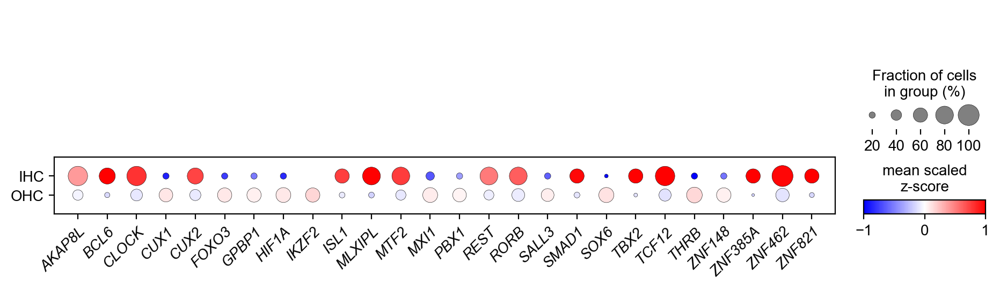

In [106]:
ax=sc.pl.dotplot(adata_mac_hc,marker_genes,layer="scaled",groupby="cell_type",
                                   cmap="bwr", colorbar_title='mean scaled\nz-score',
                                   vmin=-1,vmax=1,show=False)
plt.setp(ax['mainplot_ax'].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor",style="italic");

In [113]:
marker_genes = [
    *["AKAP8L","BCL6","CLOCK","CUX2",
     "ISL1","MLXIPL","MTF2","REST","RORB","SMAD1",
     "TBX2","TCF12","ZNF385A","ZNF462","ZNF821"], #IHC
    *["CUX1","FOXO3","GPBP1","HIF1A","IKZF2",
    "MXI1","PBX1","SALL3",
     "SOX6","THRB","ZNF148"],#OHC
    
]

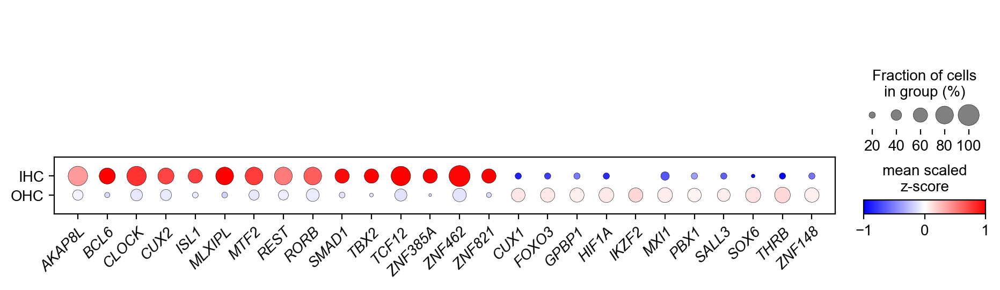

In [114]:
ax=sc.pl.dotplot(adata_mac_hc,marker_genes,layer="scaled",groupby="cell_type",
                                   cmap="bwr", colorbar_title='mean scaled\nz-score',
                                   vmin=-1,vmax=1,show=False)
plt.setp(ax['mainplot_ax'].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor",style="italic");